In [ ]:
import os
import nibabel as nib
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

In [ ]:
source_folder = 'appendicitis/TrainValid_Image'
output_folder = 'GAN/images'

# Ensure the output directory exists
os.makedirs(output_folder, exist_ok=True)

# Function to save a slice from a 3D volume as a .jpg file
def save_slice_as_jpg(volume, slice_index, output_path):
    slice_data = volume[:, :, slice_index]  # Extract a 2D slice (assuming Z-axis slices)

    # Normalize the slice to 0-255 range for image
    slice_data = np.interp(slice_data, (slice_data.min(), slice_data.max()), (0, 255))
    slice_data = slice_data.astype(np.uint8)

    # Save as .jpg
    image = Image.fromarray(slice_data)
    image.save(output_path)

# Loop over all .nii.gz files in the source folder
for filename in os.listdir(source_folder):
    if filename.endswith('.nii.gz'):
        nii_file_path = os.path.join(source_folder, filename)

        # Load the .nii.gz file using nibabel
        nii_image = nib.load(nii_file_path)
        volume = nii_image.get_fdata()  # 3D array of shape (X, Y, Z)

        # Create images for each slice in the 3D volume
        for i in range(volume.shape[2]):  # Assuming the third dimension is the slice dimension
            slice_filename = f"{filename.split('.')[0]}_slice_{i+1}.jpg"
            output_path = os.path.join(output_folder, slice_filename)

            # Save the slice as a .jpg image
            save_slice_as_jpg(volume, i, output_path)
            print(f"Saved {output_path}")

print("Conversion complete!")


Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_1.jpg
Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_2.jpg
Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_3.jpg
Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_4.jpg
Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_5.jpg
Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_6.jpg
Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_7.jpg
Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_8.jpg
Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_9.jpg
Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_10.jpg
Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_11.jpg
Saved GAN/images/ZxACC4447A6BA1EC403FAB6F640D08F5A88F6A29DE3377AAA9_slice_12.jpg
Saved GAN/images/ZxACC4447A6BA1EC403F

In [ ]:
import tensorflow as tf

# Define directories for train and test data
train_dir = r"GAN"
test_dir = r"GAN"

# Define image size and batch size
image_size = (224, 224)
batch_size = 32

# Create an ImageDataGenerator for data augmentation and preprocessing
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

# Flow images from directories
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=image_size,
    batch_size=batch_size,
    class_mode='categorical'
)

# Check out the class labels
class_labels = train_generator.class_indices
print(class_labels)

Found 95203 images belonging to 1 classes.
Found 95203 images belonging to 1 classes.
{'images': 0}


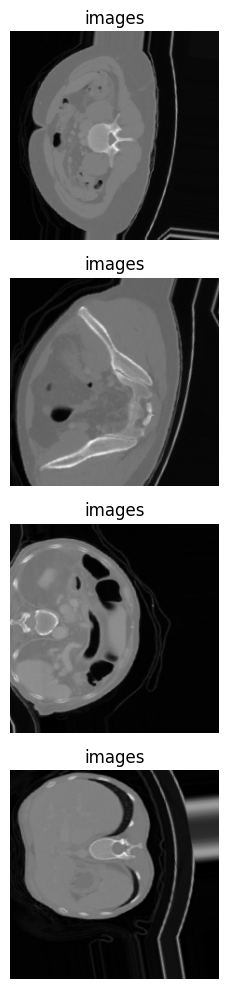

In [ ]:
import matplotlib.pyplot as plt

num_images = 4
fig, axes = plt.subplots(num_images, figsize=(10, 10))

for i in range(num_images):
    batch = next(train_generator)
    image = batch[0][i]
    label_index = batch[1][i].argmax()
    class_label = list(class_labels.keys())[list(class_labels.values()).index(label_index)]
    axes[i].imshow(image)
    axes[i].set_title(class_label)
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.autograd import Variable
import torchvision.transforms as transforms
from torchvision.utils import save_image
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

class Generator(nn.Module):
    def __init__(self, img_shape):
        super(Generator, self).__init__()
        self.img_shape = img_shape

        self.label_emb = nn.Embedding(opt.n_classes, opt.n_classes)

        def block(in_feat, out_feat, normalize=True):
            layers = [nn.Linear(in_feat, out_feat)]
            if normalize:
                layers.append(nn.BatchNorm1d(out_feat, 0.8))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *block(opt.latent_dim + opt.n_classes, 128, normalize=False),
            *block(128, 256),
            *block(256, 512),
            *block(512, 1024),
            nn.Linear(1024, int(np.prod(self.img_shape))),
            nn.Tanh()
        )

    def forward(self, noise, labels):
        # Concatenate label embedding and image to produce input
        gen_input = torch.cat((self.label_emb(labels), noise), -1)
        img = self.model(gen_input)
        img = img.view(img.size(0), *self.img_shape)
        return img


class Discriminator(nn.Module):
    def __init__(self, img_shape):
        super(Discriminator, self).__init__()
        self.img_shape = img_shape

        self.label_embedding = nn.Embedding(opt.n_classes, opt.n_classes)

        self.model = nn.Sequential(
            nn.Linear(opt.n_classes + int(np.prod(self.img_shape)), 512),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 512),
            nn.Dropout(0.4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, 1),
        )

    def forward(self, img, labels):
        # Concatenate label embedding and image to produce input
        d_in = torch.cat((img.view(img.size(0), -1), self.label_embedding(labels)), -1)
        validity = self.model(d_in)
        return validity

In [ ]:
import os
import numpy as np
import torch
import torch.nn as nn
from torch.autograd import Variable
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
from torchvision.datasets import ImageFolder

class Args:
    def __init__(self):
        self.n_epochs = 200  # Increase number of epochs
        self.batch_size = 32  # Increase batch size
        self.lr = 0.0001  # Decrease learning rate
        self.b1 = 0.5
        self.b2 = 0.999
        self.n_cpu = 8  # Increase number of CPU threads
        self.latent_dim = 100
        self.n_classes = 1
        self.img_size = 224  # Decrease image size for faster training
        self.channels = 3
        self.sample_interval = 400

opt = Args()

# Define the directory where your dataset is stored
train_dir = r"GAN"

# Define transformations to be applied to the images
transform = transforms.Compose([
    transforms.Resize((opt.img_size, opt.img_size)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5, 0.5, 0.5), std=(0.5, 0.5, 0.5))
])

# Load the dataset using ImageFolder and apply transformations
dataset = ImageFolder(root=train_d ir, transform=transform)
test_dataset = ImageFolder(root=test_dir, transform=transform)

# Create a DataLoader to handle batching and shuffling of the data
train_loader = DataLoader(dataset, batch_size=opt.batch_size, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=opt.batch_size, shuffle=False)

# Define the number of batches in one epoch
num_batches = len(train_loader)


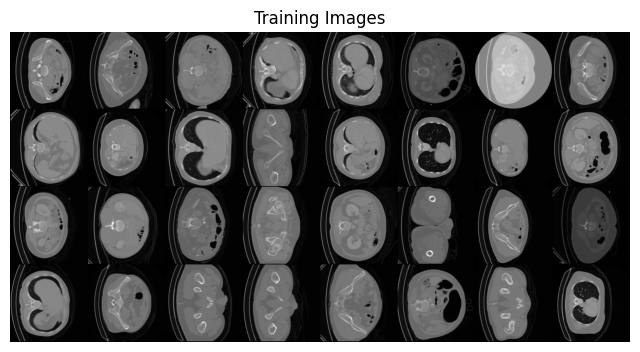

Labels of the first batch: tensor([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0])


In [ ]:
import matplotlib.pyplot as plt
import torchvision.utils as vutils

# Get some random training images and labels
images, labels = next(iter(train_loader))

# Plot some sample images
plt.figure(figsize=(8, 8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(images[:64], padding=2, normalize=True).cpu(), (1, 2, 0)))
plt.show()

# Print labels of the first batch
print("Labels of the first batch:", labels[:64])

In [ ]:
generator = Generator(img_shape=(opt.channels, opt.img_size, opt.img_size))

discriminator = Discriminator(img_shape=(opt.channels, opt.img_size, opt.img_size))
cuda = torch.cuda.is_available()

adversarial_loss = torch.nn.BCEWithLogitsLoss()

if cuda:
    generator.cuda()
    discriminator.cuda()
    adversarial_loss.cuda()

In [ ]:
# Optimizers
optimizer_G = torch.optim.Adam(generator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))
optimizer_D = torch.optim.Adam(discriminator.parameters(), lr=opt.lr, betas=(opt.b1, opt.b2))

# Set the frequency of image saving
save_interval = 50
# Training loop
for epoch in range(opt.n_epochs):
    for i, (imgs, labels) in enumerate(train_loader):

        # Adversarial ground truths
        valid = Variable(torch.FloatTensor(imgs.shape[0], 1).fill_(1.0), requires_grad=False)
        fake = Variable(torch.FloatTensor(imgs.shape[0], 1).fill_(0.0), requires_grad=False)

        # Configure input
        real_imgs = Variable(imgs.type(torch.FloatTensor))
        labels = Variable(labels.type(torch.LongTensor))

        # -----------------
        #  Train Generator
        # -----------------

        optimizer_G.zero_grad()

        # Sample noise and labels as generator input
        z = Variable(torch.FloatTensor(np.random.normal(0, 1, (imgs.shape[0], opt.latent_dim))))
        gen_labels = Variable(torch.LongTensor(np.random.randint(0, opt.n_classes, imgs.shape[0])))

        # Generate a batch of images
        gen_imgs = generator(z, gen_labels)

        # Loss measures generator's ability to fool the discriminator
        validity = discriminator(gen_imgs, gen_labels)
        g_loss = adversarial_loss(validity, valid)

        g_loss.backward()
        optimizer_G.step()

        # ---------------------
        #  Train Discriminator
        # ---------------------

        optimizer_D.zero_grad()

        # Loss for real images
        validity_real = discriminator(real_imgs, labels)
        d_real_loss = adversarial_loss(validity_real, valid)

        # Loss for fake images
        validity_fake = discriminator(gen_imgs.detach(), gen_labels)
        d_fake_loss = adversarial_loss(validity_fake, fake)

        # Total discriminator loss
        d_loss = (d_real_loss + d_fake_loss) / 2

        d_loss.backward()
        optimizer_D.step()

        # Print training stats
        print(
            "[Epoch %d/%d] [Batch %d/%d] [D loss: %f] [G loss: %f]"
            % (epoch, opt.n_epochs, i, len(train_loader), d_loss.item(), g_loss.item())
        )

        # Save generated images at specified intervals
        batches_done = epoch * len(train_loader) + i
        if batches_done % save_interval == 0:
            torch.save(generator.state_dict(), "gen/generator%d.pth" % batches_done)
            torch.save(discriminator.state_dict(), "dis/discriminator%d.pth" % batches_done)
            save_image(gen_imgs.data[:25], "images/%d.png" % batches_done, nrow=5, normalize=True)

[Epoch 0/200] [Batch 0/52] [D loss: 0.691110] [G loss: 0.686945]
[Epoch 0/200] [Batch 1/52] [D loss: 0.349439] [G loss: 0.685526]
[Epoch 0/200] [Batch 2/52] [D loss: 0.345453] [G loss: 0.694714]
[Epoch 0/200] [Batch 3/52] [D loss: 0.338728] [G loss: 0.708635]
[Epoch 0/200] [Batch 4/52] [D loss: 0.327753] [G loss: 0.729010]
[Epoch 0/200] [Batch 5/52] [D loss: 0.315465] [G loss: 0.757906]
[Epoch 0/200] [Batch 6/52] [D loss: 0.296814] [G loss: 0.801085]
[Epoch 0/200] [Batch 7/52] [D loss: 0.267892] [G loss: 0.871558]
[Epoch 0/200] [Batch 8/52] [D loss: 0.243941] [G loss: 0.966062]
[Epoch 0/200] [Batch 9/52] [D loss: 0.213992] [G loss: 1.073209]
[Epoch 0/200] [Batch 10/52] [D loss: 0.195095] [G loss: 1.166006]
[Epoch 0/200] [Batch 11/52] [D loss: 0.179740] [G loss: 1.222196]
[Epoch 0/200] [Batch 12/52] [D loss: 0.171814] [G loss: 1.240108]
[Epoch 0/200] [Batch 13/52] [D loss: 0.197847] [G loss: 1.204941]
[Epoch 0/200] [Batch 14/52] [D loss: 0.298229] [G loss: 0.822864]
[Epoch 0/200] [Batch

KeyboardInterrupt: 

In [ ]:
torch.save(generator.state_dict(), "generator_last.pth")
torch.save(discriminator.state_dict(), "discriminator_last.pth")

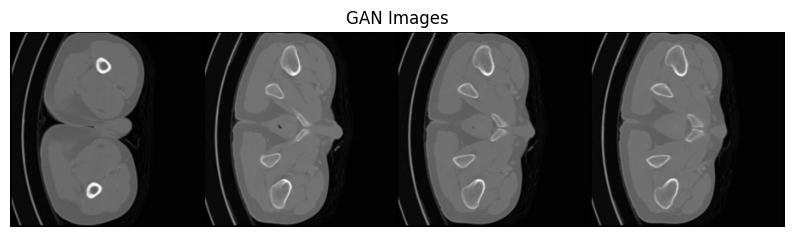

In [ ]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2


images, labels = next(iter(test_loader))
with torch.no_grad():
    try:
        gan_image = generator(z, gen_labels)
        gan_image = gan_image.squeeze().cpu().numpy()
    except:
        print()

plt.figure(figsize=(10, 10))
plt.axis("off")
plt.title("GAN Images")
plt.imshow(np.transpose(vutils.make_grid(images[:4], padding=2, normalize=True).cpu(), (1, 2, 0)))
plt.show()

